In [1]:
%load_ext autoreload
%autoreload 2
import tqdm, tqdm.notebook
tqdm.tqdm = tqdm.notebook.tqdm  # notebook-friendly progress bars
from pathlib import Path
import numpy as np

from hloc import extract_features, match_features, reconstruction, visualization, pairs_from_exhaustive, pairs_from_minseong, pairs_from_retrieval
from hloc.visualization import plot_images, read_image
from hloc.utils import viz_3d

# Pipeline for indoor localization

In [2]:
images = Path('datasets/inloc/database/cutouts/DUC2/')
outputs = Path('outputs/inloc/DUC2')  # where everything will be saved
pairs = Path('pairs/inloc/')
sfm_dir = outputs / 'sfm'
sfm_pairs_re = outputs / 'pairs-sfm-retrieval.txt'
loc_pairs = pairs / 'pairs-loc.txt'
local_features = outputs / 'local_features.h5'
query_local_features = outputs / 'query_local_features.h5'
global_features = outputs / 'global_features.h5'
matches = outputs / 'matches.h5'
loc_matches = outputs / 'loc_matches.h5'
results = outputs / 'InLoc_hloc_disk+lightglue_cosplace.txt'  # the result file

In [3]:
# !rm -rf $outputs

In [8]:
references = []
for p in (images).iterdir():
    for t in p.iterdir():
        references.append(t.relative_to(images).as_posix())
print(len(references), "mapping images")

2880 mapping images


In [9]:
feature_conf = extract_features.confs['disk']
g_feature_conf = extract_features.confs['cosplace']
matcher_conf = match_features.confs['disk+lightglue']

In [10]:
extract_features.main(feature_conf, images, image_list=references, feature_path=local_features)
extract_features.main(image_dir=images, conf=g_feature_conf, image_list=references, feature_path=global_features)

[2023/08/29 18:02:57 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 5000, 'name': 'disk'},
 'output': 'feats-disk',
 'preprocessing': {'grayscale': False, 'resize_max': 1600}}


  0%|          | 0/2880 [00:00<?, ?it/s]

[2023/08/29 18:12:35 hloc INFO] Finished exporting features.
[2023/08/29 18:12:35 hloc INFO] Extracting local features with configuration:
{'model': {'name': 'cosplace'},
 'output': 'global-feats-cosplace',
 'preprocessing': {'resize_max': 1024}}
Using cache found in /home/minseong/.cache/torch/hub/gmberton_CosPlace_main


Returning CosPlace model with backbone: ResNet50 with features dimension 2048


  0%|          | 0/2880 [00:00<?, ?it/s]

[2023/08/29 18:16:47 hloc INFO] Finished exporting features.


PosixPath('outputs/inloc/DUC2/global_features.h5')

In [11]:
pairs_from_retrieval.main(descriptors=global_features, output=sfm_pairs_re, num_matched=20)

[2023/08/29 18:16:47 hloc INFO] Extracting image pairs from a retrieval database.


1
2
3
4
5
7


[2023/08/29 18:16:52 hloc INFO] Found 57600 pairs.


In [12]:
match_features.main(matcher_conf, sfm_pairs_re, features=local_features, matches=matches);

[2023/08/29 18:16:52 hloc INFO] Matching local features with configuration:
{'model': {'features': 'disk', 'name': 'lightglue'},
 'output': 'matches-disk-lightglue'}


  0%|          | 0/41909 [00:00<?, ?it/s]

[2023/08/29 19:02:13 hloc INFO] Finished exporting matches.


In [13]:
model = reconstruction.main(sfm_dir, images, sfm_pairs_re, local_features, matches, image_list=references)
fig = viz_3d.init_figure()
viz_3d.plot_reconstruction(fig, model, color='rgba(255,0,0,0.5)', name="mapping", points_rgb=True)
fig.show()

[2023/08/29 19:02:13 hloc INFO] Creating an empty database...
[2023/08/29 19:02:14 hloc INFO] Importing images into the database...
[2023/08/29 19:03:52 hloc INFO] Importing features into the database...


  0%|          | 0/2880 [00:00<?, ?it/s]

[2023/08/29 19:03:57 hloc INFO] Importing matches into the database...


  0%|          | 0/57600 [00:00<?, ?it/s]

[2023/08/29 19:04:40 hloc INFO] Performing geometric verification of the matches...
[2023/08/29 19:05:34 hloc INFO] Running 3D reconstruction...
W0829 19:05:44.957013 2271592 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0829 19:05:44.985862 2271592 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0829 19:05:44.993369 2271592 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0829 19:05:45.022258 2271592 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W0829 19:05:45.050688 2271592 levenberg_marquardt_strategy.cc:123] Linear solver failure. Failed to compute a step: Eigen failure. Unable t

In [14]:
import pycolmap
from hloc.localize_sfm import QueryLocalizer, pose_from_cluster

In [58]:
# query = Path('datasets/inloc/query/iphone7/')
query = '132/DUC_cutout_132_120_30.jpg'

In [59]:
# query_ref = [p.relative_to(query).as_posix() for p in (query).iterdir()]

In [60]:
# len(query_ref)

In [61]:
# for reference in references:
#     if model.find_image_with_name(reference) == None:
#         continue
#     else:
#         ref_ids.append(model.find_image_with_name(reference).image_id)

In [62]:
# len(references)

In [63]:
# conf = {
#     'estimation': {'ransac': {'max_error': 12}},
#     'refinement': {'refine_focal_length': True, 'refine_extra_params': True},
# }

In [64]:
extract_features.main(feature_conf, images, image_list=[query], feature_path=local_features, overwrite=True)
pairs_from_exhaustive.main(loc_pairs, image_list=[query], ref_list=references)
match_features.main(matcher_conf, loc_pairs, features=local_features, matches=matches, overwrite=True);

[2023/08/30 10:04:21 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 5000, 'name': 'disk'},
 'output': 'feats-disk',
 'preprocessing': {'grayscale': False, 'resize_max': 1600}}


  0%|          | 0/1 [00:00<?, ?it/s]

[2023/08/30 10:04:22 hloc INFO] Finished exporting features.
[2023/08/30 10:04:22 hloc INFO] Found 2880 pairs.
[2023/08/30 10:04:22 hloc INFO] Matching local features with configuration:
{'model': {'features': 'disk', 'name': 'lightglue'},
 'output': 'matches-disk-lightglue'}


  0%|          | 0/2880 [00:00<?, ?it/s]

[2023/08/30 10:06:21 hloc INFO] Finished exporting matches.


In [65]:
# for q in query_ref:
#     cur_query = q
#     extract_features.main(feature_conf, query, image_list=[cur_query], feature_path=local_features, overwrite=True)
#     pairs_from_exhaustive.main(loc_pairs, image_list=[cur_query], ref_list=references)
#     match_features.main(matcher_conf, loc_pairs, features=local_features, matches=matches, overwrite=True)

#     camera = pycolmap.infer_camera_from_image(query / q)
#     localizer = QueryLocalizer(model, conf)
#     ret, log = pose_from_cluster(localizer, str(query / q), camera, ref_ids, local_features, matches)
#     print('tvec: '+ret['tvec'], ' qvec: '+ret['qvec'])

In [66]:
camera = pycolmap.infer_camera_from_image(images / query)
# ref_ids = [model.find_image_with_name(r).image_id for r in references]
ref_ids = []
for reference in references:
    # print(model.find_image_with_name(reference).image_id)
    # print(reference)
    # print(model.find_image_with_name(reference))
    if model.find_image_with_name(reference) == None:
        continue
    else:
        ref_ids.append(model.find_image_with_name(reference).image_id)

conf = {
    'estimation': {'ransac': {'max_error': 12}},
    'refinement': {'refine_focal_length': True, 'refine_extra_params': True},
}
localizer = QueryLocalizer(model, conf)
ret, log = pose_from_cluster(localizer, query, camera, ref_ids, local_features, matches)

In [67]:
ret

{'success': True,
 'qvec': array([ 0.77294862,  0.04142141, -0.58377439,  0.24503502]),
 'tvec': array([-3.96661668, -0.16850049,  3.57827086]),
 'num_inliers': 6,
 'inliers': [True,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  True,
  False,
  False,
  False,
  False,
  True,
  False,
  False,
  False,
  False,
  True,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  True,
  True,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False,
  False],
 'camera': {'model': 'SIMPLE_RADIAL',
  'width': 1600,
  'height': 1200,
  'params': array([ 1.79411227e+03,  8.00000000e+02,  6.00000000e+02, -3.99914509e-01])}}

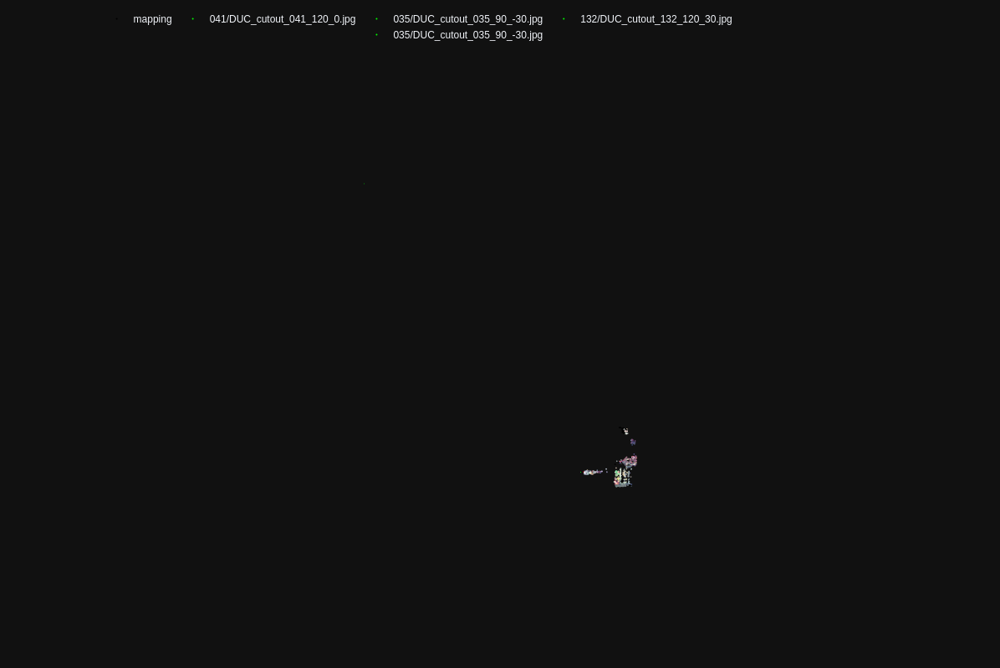

In [68]:
pose = pycolmap.Image(tvec=ret['tvec'], qvec=ret['qvec'])
viz_3d.plot_camera_colmap(fig, pose, camera, color='rgba(0,255,0,0.5)', name=query, fill=True)
# visualize 2D-3D correspodences
inl_3d = np.array([model.points3D[pid].xyz for pid in np.array(log['points3D_ids'])[ret['inliers']]])
viz_3d.plot_points(fig, inl_3d, color="lime", ps=1, name=query)
fig.show()